In [3]:
import numpy as np
import onix
import openmc
openmc.config['cross_sections'] = '/home/elhareefmh/MC/endfb-viii.0-hdf5/cross_sections.xml'

In [4]:
# ====== dimensional data ======
# 
# --- graphite core block ---
l_cgb    =  5.080 # length
w_cgb    =  5.080 # width
l_cgb_ch =  3.048 # single core channel length
w_cgb_ch =  1.016 # single core channel width
r_cgb_ch =  0.508 # single core channel end radius
# --- core ---
r_core   = 70.485 # core radius
h_core   =170.18  # core height
h_bound  = 50.0   # fictitious upper and lower boundary
# --- control element ---
di_ce_p  = 2.1336 # inner diameter of poison (Gd2O3_Al2O3)
do_ce_p  = 2.7432 # outer diameter of poison (Gd2O3_Al2O3)
t_ce_it  = 0.0508 # thickness of inner tube
t_ce_ot  = 0.0508 # thickness of outer tube
di_ce_t  = 4.9149 # thimble inner diameter
do_ce_t  = 5.0800 # thimble outer diameter
d_ce_in  = 0.5080 # distance between circle-square intersection and the square corner
# --- sample basket ---
di_sb    = 5.0000 # basket diameter
l_sb_bar = 1.1938 # graphite bar length
w_sb_bar = 0.6350 # graphite bar width
d_sb_ino = 0.6350 # INOR-8 sample diameter
# 
# ====== physics data ======
# 
nps=1000
nbatch=200
# 
# ************************************************************************
# *                        utility function                              *
# ************************************************************************
# 
sqrt2=np.sqrt(2.0)
sqrt3=np.sqrt(3.0)
pi=np.pi

def CreateMaterial():
   # m1 = fuel salt
   # m2 = graphite
   # m3 = Gd2O3 + 30% Al2O3
   # m4 = inconel 600
   # m5 = INOR-8
   # 
   # ====== salt ======
   # 
   # obtained from /Users/tfei/Desktop/MSRTritium/MCNP/MaterialData/FuelSalt_MEU.txt
   m1=openmc.Material(temperature=900.0)
   m1.set_density('g/cm3',2.3243)
   m1.add_nuclide('Be9'  ,1.18410E-01,'ao')
   m1.add_nuclide('F19'  ,5.94485E-01,'ao')
   m1.add_nuclide('Li6'  ,3.07439E-05,'ao')
   m1.add_nuclide('Li7'  ,2.63554E-01,'ao')
   m1.add_nuclide('U235' ,1.00802E-03,'ao')
   m1.add_nuclide('U238' ,2.23617E-03,'ao')
   m1.add_nuclide('Zr90' ,1.04320E-02,'ao')
   m1.add_nuclide('Zr91' ,2.27496E-03,'ao')
   m1.add_nuclide('Zr92' ,3.47733E-03,'ao')
   m1.add_nuclide('Zr94' ,3.52397E-03,'ao')
   m1.add_nuclide('Zr96' ,5.67727E-04,'ao')
   # 
   # ====== graphite ======
   # 
   m2=openmc.Material(temperature=600.0)
   m2.set_density('g/cm3',1.86)
   m2.add_element('C',1.0,'ao')
   m2.add_s_alpha_beta('c_Graphite')
   # 
   # ====== Gd2O3_Al2O3 ======
   # 
   m3=openmc.Material(temperature=900.0)
   m3.set_density('g/cm3',5.873)
   m3.add_element('Al',1.20000E-01,'ao')
   m3.add_element('Gd',2.80000E-01,'ao')
   m3.add_element('O' ,6.00000E-01,'ao')
   # 
   # ====== inconel ======
   # 
   m4=openmc.Material(temperature=900.0)
   m4.set_density('g/cm3',8.47)
   m4.add_element('Ni',0.72,'ao')
   m4.add_element('Cr',0.17,'ao')
   m4.add_element('Fe',0.10,'ao')
   m4.add_element('Mn',0.01,'ao')
   # 
   # ====== INOR-8 ======
   # 
   m5=openmc.Material(temperature=900.0)
   m5.set_density('g/cm3',8.7745)
   m5.add_element('Ni',0.70,'ao')
   m5.add_element('Mo',0.17,'ao')
   m5.add_element('Cr',0.07,'ao')
   m5.add_element('Fe',0.05,'ao')
   m5.add_element('Mn',0.01,'ao')
   return [m1,m2,m3,m4,m5]

[m1,m2,m3,m4,m5]=CreateMaterial()

helium=openmc.Material(temperature=900.0)
helium.set_density('g/cm3',1)
helium.add_element('He',1,'ao')

materials=openmc.Materials([m1,m2,m3,m4,m5, helium])
materials.cross_sections = '/home/elhareefmh/MC/endfb-viii.0-hdf5/cross_sections.xml'
materials.export_to_xml()

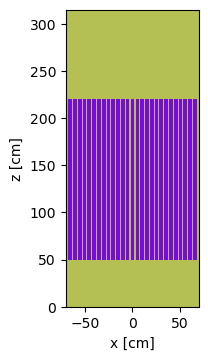

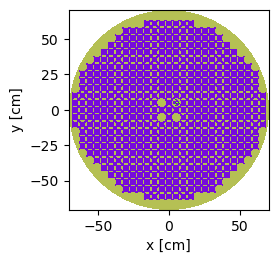

In [5]:
# ================================================
#                define geometry
# ================================================
# 
# ====== surface ====== 
# 
# --- axial boundary ---
zl=openmc.ZPlane(z0=0.0,   boundary_type='vacuum')
z1=openmc.ZPlane(z0=h_bound)
z2=openmc.ZPlane(z0=h_bound+h_core)
zu=openmc.ZPlane(z0=h_core+2*h_bound,boundary_type='vacuum')
# --- control element boundary circle ---
r_ce = np.sqrt((l_cgb/2.0-d_ce_in)**2+(w_cgb/2.0)**2)


rc=openmc.ZCylinder(x0=0.0,y0=0.0,r=r_core,boundary_type='vacuum')

l_cgb_sch=l_cgb_ch-r_cgb_ch*2.0


def create_rotated_plane(x0, y0, theta):
    """
    Create an OpenMC plane that passes through (x0, y0) and makes an angle theta with the x-axis.
    
    Parameters:
        x0 (float): X-coordinate of the point the plane passes through.
        y0 (float): Y-coordinate of the point the plane passes through.
        theta (float): Angle in degrees, measured from the x-axis.

    Returns:
        openmc.Plane: The rotated plane object.
    """
    # Convert theta from degrees to radians
    theta_rad = np.radians(theta)

    # Compute normal vector components (perpendicular to the direction)
    A = np.sin(theta_rad)  # Normal's x-component
    B = -np.cos(theta_rad) # Normal's y-component
    C = 0                  # No tilt in Z direction

    # Compute D using the given point (x0, y0)
    D = A * x0 + B * y0

    # Create the OpenMC plane
    return openmc.Plane(a=A, b=B, c=C, d=D)


lattice =      [['u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u1','u1', 'u1', 'u1','u1','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2'],
                ['u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u4', 'u1', 'u4','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u6','u3', 'u7', 'u3','u9','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u5', 'u1', 'u5','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u6','u3', 'u7','u10','u9','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u8', 'u1', 'u8','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2'],
                ['u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2'],
                ['u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u2','u2','u1','u1','u1','u1','u1', 'u1', 'u1','u1','u1','u1','u1','u2','u2','u2','u2','u2','u2','u2','u2'],
                ['u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u1','u1', 'u1', 'u1','u1','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2','u2']]

fuel_region = (-rc & +zl & -z1) | (-rc & +z2 & -zu)
non_fuel_cells = []
x0 = -27.0/2.0*l_cgb
y0 = -27.0/2.0*w_cgb
dx = l_cgb
dy = w_cgb

for i in range(27):
    for j in range(27):

        x00 = x0+i*dx
        x_center = x00 + dx/2
        xl_cgb =openmc.XPlane(x0=x00)
        xu_cgb = openmc.XPlane(x0=x00+dx)
        
        y00=y0+j*dy
        y_center = y00+dy/2
        yl_cgb =openmc.YPlane(y0=y00)
        yu_cgb = openmc.YPlane(y0=y00+dy)
        u = lattice[i][j]

        #left channel
        xu_cgb_lch=openmc.XPlane(x0=x_center-l_cgb/2.0+w_cgb_ch/2.0)
        rt_cgb_lch=openmc.ZCylinder(x0=x_center-l_cgb/2.0,y0= y_center+l_cgb_sch/2.0,r=r_cgb_ch)
        rb_cgb_lch=openmc.ZCylinder(x0=x_center-l_cgb/2.0,y0= y_center-l_cgb_sch/2.0,r=r_cgb_ch)
        yu_cgb_vch=openmc.YPlane(y0= y_center+l_cgb_sch/2.0)
        yl_cgb_vch=openmc.YPlane(y0= y_center-l_cgb_sch/2.0)

        # top channel
        yl_cgb_tch=openmc.YPlane(y0=y_center+w_cgb/2.0-w_cgb_ch/2.0)
        rl_cgb_tch=openmc.ZCylinder(x0=x_center-l_cgb_sch/2.0,y0=y_center+w_cgb/2.0,r=r_cgb_ch)
        rr_cgb_tch=openmc.ZCylinder(x0=x_center+l_cgb_sch/2.0,y0=y_center+w_cgb/2.0,r=r_cgb_ch)
        xu_cgb_hch=openmc.XPlane(x0=x_center+l_cgb_sch/2.0)
        xl_cgb_hch=openmc.XPlane(x0=x_center-l_cgb_sch/2.0)
           
        # right channel
        xl_cgb_rch=openmc.XPlane(x0=x_center+l_cgb/2.0-w_cgb_ch/2.0)
        rt_cgb_rch=openmc.ZCylinder(x0=x_center+l_cgb/2.0,y0=y_center+l_cgb_sch/2.0,r=r_cgb_ch)
        rb_cgb_rch=openmc.ZCylinder(x0=x_center+l_cgb/2.0,y0=y_center-l_cgb_sch/2.0,r=r_cgb_ch)

        # bottom channel
        yu_cgb_bch=openmc.YPlane(y0=y_center-w_cgb/2.0+w_cgb_ch/2.0)
        rl_cgb_bch=openmc.ZCylinder(x0=x_center-l_cgb_sch/2.0,y0=y_center-w_cgb/2.0,r=r_cgb_ch)
        rr_cgb_bch=openmc.ZCylinder(x0=x_center+l_cgb_sch/2.0,y0=y_center-w_cgb/2.0,r=r_cgb_ch)

        sr_ceb=openmc.ZCylinder(x0=x_center,y0=y_center-w_cgb,r=r_ce) # bottom circle
        sr_cet=openmc.ZCylinder(x0=x_center,y0=y_center+w_cgb,r=r_ce) # top circle
        sr_cel=openmc.ZCylinder(x0=x_center-l_cgb,y0=y_center,r=r_ce) # left circle
        sr_cer=openmc.ZCylinder(x0=x_center+l_cgb,y0=y_center,r=r_ce) # right circle
                                    
        if u == 'u1':  #fuel_block

           rg1 = (+xl_cgb & -xu_cgb_lch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (+xl_cgb & -rt_cgb_lch & +yu_cgb_vch)
           rg3 = (+xl_cgb & -rb_cgb_lch & -yl_cgb_vch)
           rg_lch = (rg1 | rg2 | rg3)

           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb_tch & -yu_cgb)
           rg2 = (-yu_cgb & -rl_cgb_tch & -xl_cgb_hch)
           rg3 = (-yu_cgb & -rr_cgb_tch & +xu_cgb_hch)
           rg_tch = (rg1 | rg2 | rg3)

           rg1 = (-xu_cgb & +xl_cgb_rch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (-xu_cgb & -rt_cgb_rch & +yu_cgb_vch)
           rg3 = (-xu_cgb & -rb_cgb_rch & -yl_cgb_vch)
           rg_rch = (rg1 | rg2 | rg3)
 
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb & -yu_cgb_bch)
           rg2 = (+yl_cgb & -rl_cgb_bch & -xl_cgb_hch)
           rg3 = (+yl_cgb & -rr_cgb_bch & +xu_cgb_hch)
           rg_bch = (rg1 | rg2 | rg3)

           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)

           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u2': # radial region around fuel blocks
           rg_ch =  +xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u3': # center control element

           r2 = di_ce_p/2.0 # poison inner radius
           r3 = do_ce_p/2.0 # poison outer radius
           r1 = r2 - t_ce_it # inner tube inner radius
           r4 = r3 + t_ce_ot # outer tube outer radius
           r5 = di_ce_t/2.0 # thimble inner radius
           r6 = do_ce_t/2.0 # thimble outer radius
 
           s1 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r1)
           s2 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r2)
           s3 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r3)
           s4 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r4)
           s5 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r5)
           s6 = openmc.ZCylinder(x0=x_center,y0=y_center,r=r6)

         ## c1=openmc.Cell(fill=m1,region=(-s1))       # fuel
         # c2=openmc.Cell(fill=m4,region=(+s1 & -s2 & +z1 & -z2)) # inner tube
         # c3=openmc.Cell(fill=m3,region=(+s2 & -s3 & +z1 & -z2)) # poison
         # c4=openmc.Cell(fill=m4,region=(+s3 & -s4 & +z1 & -z2)) # outer tube
         # c5=openmc.Cell(fill=m1,region=(+s4 & -s5 & +z1 & -z2)) # fuel
         # c6=openmc.Cell(fill=m5,region=(+s5 & -s6 & +z1 & -z2)) # thimble
         ## c7=openmc.Cell(fill=m1,region=(+s6 & +z1 & -z2))      # everything outside
         # non_fuel_cells.append.([c2,c3,c4,c5,c6,])
         # rg_ch = -s1 | +s6
         # fuel_region |= (rg_ch & +z1 & -z2)
           rg_ch =  +xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb
           fuel_region |= (rg_ch & +z1 & -z2)
        
        elif u == 'u4':  # above control element
           
           rg1 = (+xl_cgb & -xu_cgb_lch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (+xl_cgb & -rt_cgb_lch & +yu_cgb_vch)
           rg3 = (+xl_cgb & -rb_cgb_lch & -yl_cgb_vch)
           rg_lch = (rg1 | rg2 | rg3)
           # top channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb_tch & -yu_cgb)
           rg2 = (-yu_cgb & -rl_cgb_tch & -xl_cgb_hch)
           rg3 = (-yu_cgb & -rr_cgb_tch & +xu_cgb_hch)
           rg_tch = (rg1 | rg2 | rg3)
           # right channel
           rg1 = (-xu_cgb & +xl_cgb_rch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (-xu_cgb & -rt_cgb_rch & +yu_cgb_vch)
           rg3 = (-xu_cgb & -rb_cgb_rch & -yl_cgb_vch)
           rg_rch = (rg1 | rg2 | rg3)
           # bottom channel
           rg_bch = (+yl_cgb & -sr_ceb)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)
           
           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u5': #BetweenCEV
           
           # left channel
           rg1 = (+xl_cgb & -xu_cgb_lch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (+xl_cgb & -rt_cgb_lch & +yu_cgb_vch)
           rg3 = (+xl_cgb & -rb_cgb_lch & -yl_cgb_vch)
           rg_lch = (rg1 | rg2 | rg3)
           # top channel
           rg_tch = (-yu_cgb & -sr_cet)
           # right channel
           rg1 = (-xu_cgb & +xl_cgb_rch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (-xu_cgb & -rt_cgb_rch & +yu_cgb_vch)
           rg3 = (-xu_cgb & -rb_cgb_rch & -yl_cgb_vch)
           rg_rch = (rg1 | rg2 | rg3)
           # bottom channel
           rg_bch = (+yl_cgb & -sr_ceb)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)
           
           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u =='u6' : # LeftCE
           # left channel
           rg1 = (+xl_cgb & -xu_cgb_lch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (+xl_cgb & -rt_cgb_lch & +yu_cgb_vch)
           rg3 = (+xl_cgb & -rb_cgb_lch & -yl_cgb_vch)
           rg_lch = (rg1 | rg2 | rg3)
           # top channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb_tch & -yu_cgb)
           rg2 = (-yu_cgb & -rl_cgb_tch & -xl_cgb_hch)
           rg3 = (-yu_cgb & -rr_cgb_tch & +xu_cgb_hch)
           rg_tch = (rg1 | rg2 | rg3)
           # right channel
           rg_rch = (-xu_cgb & -sr_cer)
           # bottom channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb & -yu_cgb_bch)
           rg2 = (+yl_cgb & -rl_cgb_bch & -xl_cgb_hch)
           rg3 = (+yl_cgb & -rr_cgb_bch & +xu_cgb_hch)
           rg_bch = (rg1 | rg2 | rg3)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)

           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u7': #BetweenCEH
            # left channel
           rg_lch = (+xl_cgb & -sr_cel)
           # top channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb_tch & -yu_cgb)
           rg2 = (-yu_cgb & -rl_cgb_tch & -xl_cgb_hch)
           rg3 = (-yu_cgb & -rr_cgb_tch & +xu_cgb_hch)
           rg_tch = (rg1 | rg2 | rg3)
           # right channel
           rg_rch = (-xu_cgb & -sr_cer)
           # bottom channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb & -yu_cgb_bch)
           rg2 = (+yl_cgb & -rl_cgb_bch & -xl_cgb_hch)
           rg3 = (+yl_cgb & -rr_cgb_bch & +xu_cgb_hch)
           rg_bch = (rg1 | rg2 | rg3)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)

           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u8': #BelowCE
            # left channel
           rg1 = (+xl_cgb & -xu_cgb_lch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (+xl_cgb & -rt_cgb_lch & +yu_cgb_vch)
           rg3 = (+xl_cgb & -rb_cgb_lch & -yl_cgb_vch)
           rg_lch = (rg1 | rg2 | rg3)
           # top channel
           rg_tch = (-yu_cgb & -sr_cet)
           # right channel
           rg1 = (-xu_cgb & +xl_cgb_rch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (-xu_cgb & -rt_cgb_rch & +yu_cgb_vch)
           rg3 = (-xu_cgb & -rb_cgb_rch & -yl_cgb_vch)
           rg_rch = (rg1 | rg2 | rg3)
           # bottom channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb & -yu_cgb_bch)
           rg2 = (+yl_cgb & -rl_cgb_bch & -xl_cgb_hch)
           rg3 = (+yl_cgb & -rr_cgb_bch & +xu_cgb_hch)
           rg_bch = (rg1 | rg2 | rg3)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)

           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)

        elif u == 'u9': #RightCE
            # left channel
           rg_lch = (+xl_cgb & -sr_cel)
           # top channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb_tch & -yu_cgb)
           rg2 = (-yu_cgb & -rl_cgb_tch & -xl_cgb_hch)
           rg3 = (-yu_cgb & -rr_cgb_tch & +xu_cgb_hch)
           rg_tch = (rg1 | rg2 | rg3)
           # right channel
           rg1 = (-xu_cgb & +xl_cgb_rch & +yl_cgb_vch & -yu_cgb_vch)
           rg2 = (-xu_cgb & -rt_cgb_rch & +yu_cgb_vch)
           rg3 = (-xu_cgb & -rb_cgb_rch & -yl_cgb_vch)
           rg_rch = (rg1 | rg2 | rg3)
           # bottom channel
           rg1 = (+xl_cgb_hch & -xu_cgb_hch & +yl_cgb & -yu_cgb_bch)
           rg2 = (+yl_cgb & -rl_cgb_bch & -xl_cgb_hch)
           rg3 = (+yl_cgb & -rr_cgb_bch & +xu_cgb_hch)
           rg_bch = (rg1 | rg2 | rg3)
           # all channels
           rg_ch = ((rg_lch | rg_tch | rg_rch | rg_bch))
           # graphite
           rg_tot = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb)
           rg_gr = (rg_tot & (~rg_ch) & +z1 & -z2)

           non_fuel_cells.append(openmc.Cell(name='graphite',fill=m2,region=rg_gr))
           fuel_region |= (rg_ch & +z1 & -z2)
        elif u == 'u10': #SampleBasket

            R=di_sb/2.0    # radius R of the basket
            r=d_sb_ino/2.0 # radius r of the INOR-8 sample
            l=l_sb_bar     # length of the graphite sample bar
            w=w_sb_bar     # width of the graphite sample bar
            # temporary variable 
            d1=np.sqrt(R**2-l**2)
            theta1=np.arcsin((l+r)/(R-r))
            theta2=np.arcsin(l/R)
            # coordinate
            y1=l
            x1=d1
            x2=x1-3*w
            y3=(r*2.0/sqrt3+r)*sqrt3-x2*sqrt3
            x3=x2-r
            y4=(d1-2*w)*np.sin(2.0*pi/3.0)
            x4=(d1-2*w)*np.cos(2.0*pi/3.0)
            y5=d1*np.sin(2.0*pi/3.0)
            x5=d1*np.cos(2.0*pi/3.0)
            y6=l+r
            x6=np.sqrt((R-r)**2-y6**2)
            y7=y6
            x7=x6-2*r
            y8=(R-r)*np.sin(2.0/3.0*pi-theta1)
            x8=(R-r)*np.cos(2.0/3.0*pi-theta1)
            y9=(d1-w)*np.sin(2.0*pi/3.0)
            x9=(d1-w)*np.cos(2.0*pi/3.0)
            y10=R*np.sin(2.0/3.0*pi-theta2)
            x10=R*np.cos(2.0/3.0*pi-theta2)
                # 
           # ====== surfaces ======
                   # 
           # INOR-8
            sr1=openmc.ZCylinder(x0=x3,y0=y3,r=r)
            sr2=openmc.ZCylinder(x0=x6,y0=y6,r=r)
            sr3=openmc.ZCylinder(x0=x7,y0=y7,r=r)
            sr4=openmc.ZCylinder(x0=x8,y0=y8,r=r)
           # graphite sample
            p1=openmc.YPlane(y0=0.0)
            p2=openmc.XPlane(x0=x1)
            p3=openmc.XPlane(x0=x1-w)
            p4=openmc.XPlane(x0=x1-2*w)
            p5=openmc.XPlane(x0=x2)
            
            p6=create_rotated_plane(0,0, -60.0)
            p7=create_rotated_plane(x5,y5,30.0)
            p8=create_rotated_plane(x9,y9,30.0)
            p9=create_rotated_plane(x4,y4,30.0)
            p10=create_rotated_plane(x10,y10,-60.0)
            
            p11=openmc.YPlane(y0=l)
            # basket
            srt=openmc.ZCylinder(x0=0.0,y0=0.0,r=R)
            p12=create_rotated_plane(0.0,0.0,60.0)
            p13=create_rotated_plane(0.0,0.0,-60.0)
            # 
            # ====== cells ======
            # 
            # INOR-8 sample
            rg_inor=((-sr1 | -sr2 | -sr3 | -sr4))
            c1=openmc.Cell(fill=m5,region=rg_inor)
            #graphite sample
            rg1=(+p1 & -p11 & +p3 & -p2)
            rg2=(+p1 & -p11 & +p4 & -p3)
            rg3=(+p1 & -p11 & +p5 & -p4)
            rg4=(-p6 & +p10 & +p7 & -p8)
            rg5=(-p6 & +p10 & +p8 & -p9)
            rg_gr=((rg1 | rg2 | rg3 | rg4 | rg5))
            c2=openmc.Cell(fill=m2,region=rg_gr)
            # fuel
            rg_tot=(+p1 & -p6 & -srt)
            rg_fl=((rg_tot & ((~rg_gr) | (~rg_inor))))
            c3=openmc.Cell(fill=m1,region=rg_fl)
            uu=openmc.Universe(cells=[c1,c2,c3])
            # basket
            rg1=(+p1  & -p12 & -srt)
            rg2=(+p12 & -p13 & -srt)
            rg3=(+p13 & -p1  & -srt)
            c4=openmc.Cell(fill=uu,region=rg1)
            c4.rotation=(0.0,0.0,60.0)
            c5=openmc.Cell(fill=uu,region=rg2)
            c5.rotation=(0.0,0.0,-60.0)
            c6=openmc.Cell(fill=uu,region=rg3)
            c6.rotation=(0.0,0.0,-180.0)
            uv=openmc.Universe(cells=[c4,c5,c6])

            srt2=openmc.ZCylinder(x0=x_center,y0=y_center,r=R)

            basket = openmc.Cell(name='sample',fill=uv,region=(-srt2& +z1 & -z2))
            basket.translation = (x_center, y_center, 0.0)

            non_fuel_cells.append(basket)

            f_rgn = (+xl_cgb & -xu_cgb & +yl_cgb & -yu_cgb & +srt2 & +z1 & -z2)
            fuel_region |= f_rgn

X1 = openmc.XPlane(x0 = -27.0/2.0*l_cgb)
X2 = openmc.XPlane(x0 = 27.0/2.0*l_cgb)
Y1 = openmc.YPlane(y0 = -27.0/2.0*w_cgb)
Y2 = openmc.YPlane(y0 = 27.0/2.0*w_cgb)

#outer_region = (-X1 | +X2 | -Y1 | +Y2) & -rc & +z1 & -z2
lat_rgn = +X1 & -X2 & +Y1 & -Y2
outer_region = -rc & ~lat_rgn & +z1 & -z2
fuel_region |= outer_region
fuel_region = fuel_region & ~ +rc
fuel_cell = openmc.Cell(name = 'core_cell', fill=m1,region=fuel_region)


zu_loop=openmc.ZPlane(z0=h_core+2*h_bound+39.5570,boundary_type='vacuum')
zu_pump = openmc.ZPlane(z0=h_core+2*h_bound+39.5570+5.2281,boundary_type='vacuum')

loop_region = +zu & - zu_loop & -rc
pump_region = +zu_loop & - zu_pump & -rc

loop_cell = openmc.Cell(name = 'loop_cell', fill=m1,region=loop_region)

pump_cell = openmc.Cell(name = 'pump_cell', fill = m1, region=pump_region)


cells = non_fuel_cells+[fuel_cell, loop_cell, pump_cell]
u0=openmc.Universe(cells=cells)

# Create root Cell
root_cell = openmc.Cell(name='root cell')
root_cell.fill = u0
root_cell.region = -rc & +zl & -zu_pump

root_universe = openmc.Universe(universe_id=0, name='root universe')
root_universe.add_cell(root_cell)

root_universe.plot(pixels=40000, basis='xz', color_by='material')
root_universe.plot(color_by='material')

geometry = openmc.Geometry(root=root_universe)
geometry.export_to_xml()


In [6]:
settings=openmc.Settings()
settings.source=openmc.Source(space=openmc.stats.Point(xyz=(0.0,0.0,0.5)))
settings.particles=nps
settings.batches= nbatch
settings.inactive=50
settings.export_to_xml()

#openmc.run(threads=20)

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/source.py:658: FutureWarning: This class is deprecated in favor of 'IndependentSource'
  warnings.warn("This class is deprecated in favor of 'IndependentSource'", FutureWarning)


In [7]:
import math

duration = [10, 14, 12, 12, 28, 1772, 72, 24, 30, 42, 48,
            24, 12, 12, 12, 60, 96, 252, 72, 12, 84, 48, 38, 42, 132,
            414, 30, 12, 278, 104, 318, 12, 48, 2120, 64, 6, 354, 188,
            120, 24, 28, 30, 24, 664, 326, 288, 108, 360, 28, 20, 324,
            192, 183, 9, 140, 48, 28, 912, 264, 72, 96, 72, 1032,
            34, 26, 12, 36, 48, 360, 12, 120, 524, 922, 60, 78, 772, 68,
            216, 72, 204, 210, 258, 192, 960, 196, 434, 284, 154, 72,
            48, 312] #hours

power = [0.25, 0.0, 0.5, 0.0, 1.0, 0.0, 0.0694, 0.0, 2.5, 0.0, 2.5,
         0.0, 5.0, 0.0, 5.0, 0.0, 5.0, 0.0, 5.25, 0.0, 6.5, 0.0, 5.0,
         0.0, 6.3976, 0.0, 7.34, 0.0, 6.9938, 0.0, 7.2015, 0.0, 7.34,
         0.0, 5.3281, 0.0, 5.8814, 0.0, 6.771, 0.0, 7.34, 0.0, 7.34, 0.0,
         7.34, 7.34, 7.34, 0.0, 5.5843, 0.0, 6.8106, 7.34, 7.0576, 0.0,
         6.8674, 0.0, 0.0, 7.239, 7.34, 6.7936, 7.34, 7.34, 0.0, 0.0, 
         4.8462, 0.0, 7.0, 0.0, 7.0, 0.0, 7.0, 6.9008, 0.0, 7.34, 0.0,
         7.1945, 0.0, 7.1892, 7.34, 7.1298, 0.0, 7.34, 7.34, 4.9896,
         0.0, 5.0, 7.34, 5.0, 0.0, 1.87, 7.2469] #MW
         
count  = 0
coulative_time = [] #miunts
sub_steps = []
for d in duration:
    count+=d*60
    coulative_time.append(count)
    sub_steps.append(math.ceil(d/100))


total_volume = (h_core+2*h_bound + 39.5570+5.2281) * pi * r_core**2 #cm^3

power_density = result = [x * 1E6 / total_volume for x in power] #KW/l

macrostep_vector = coulative_time
macrostep_unit = 'm'

norma_vector = power_density
norma_unit = 'power'

microstep_vector = sub_steps

sequence1 = onix.Sequence(1)
sequence1.set_macrostep(macrostep_vector, macrostep_unit)
sequence1.set_norma(norma_vector, norma_unit)
sequence1.microstep_vector = microstep_vector

sequence1.flux_approximation ='iv'

msr = onix.couple.Couple_msr()

msr.set_bounding_box([-226.45, -226.45, 0.0], [226.45, 226.45, 425.5])

loop_dict = {
             'core_cell': {
                      'upstream_cells': [('loop_cell', 1)],
                      'elements_removal': [('Nb', 2.07E-08), ('Mo', 3.53E-08), ('Ru', 1.34E-08), ('Te', 3.49E-08)]
             },
             'loop_cell': {
                     'upstream_cells': [('core_cell', 0.95), ('pump_cell', 0.05)],
                     'elements_removal': [('Nb', 2.89352E-08), ('Mo', 1.25386E-07), ('Ru', 2.89352E-08), ('Te', 1.92901E-07)]
             },
             'pump_cell': {
                     'upstream_cells': [('core_cell', 0.05)],
                     'elements_removal': [('Nb', 7.26137E-08), ('Mo', 1.69064E-07), ('Ru', 7.26137E-08), ('Te', 2.3658E-07),
                                         ('Tc', 4.36785E-08), ('Sb', 4.36785E-08), ('Kr', 6.72E-04), ('Xe', 6.72E-04)]
                     
             }
}
msr.vol_flow_rate = 0

msr.select_bucells(loop_dict = loop_dict)

msr.import_openmc(root_cell)

msr.set_sequence(sequence1)

vol_dict = {'core_cell': 1.2885E6, 'loop_cell': 0.6174E6  , 'pump_cell': 0.0816E6 , 'total volume':total_volume}
msr.set_vol(vol_dict)

#msr.set_MPI('srun', '20')
msr.burn()









    .*#############*        #####,        #####    ####.   #####,       #####,
   ######* ###########*     #######.      #####    ####.    .#####    #####*
 ######## # ############    #########     #####    ####.     .#####, #####*
######## ##*.##.#########,  ##########    #####    ####.        ########
#######,,### ,.. ########   ##### ,#####  #####    ####.         *#####
####### ##### ### #######   #####   #####,#####    ####.       .########,
 ,####* *######## .#####    #####     #########    ####.     ,#####, #####.
  *#######  *  *######*     #####      *#######    ####.    ######    *#####
      *############,        #####       .######    ####.   #####.       #####*


An open-source depletion code for reactor simulation and nuclear archaeology






{}
=== OpenMC pre-run ===



                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")





----  Default decay constants library set for system  ----
---- /home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/onix/data/default_libs/decay_lib_reduced ----



----  Default fission yields library set for system  ----
---- /home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/onix/data/default_libs/fy_lib_reduced ----



----  Path for cross sections library ----


----  /home/elhareefmh/MC/endfb-viii.0-hdf5  ----






***********Sampling isomeric branching data***********






***********Sampling point-wise cross section data***********




 Time to sample cross sections: 4.76837158203125e-07




====== STEP 1======







=== OpenMC Transport 1===



bucell name core_cell
nucl list when set to tally ['H1', 'H2', 'H3', 'He3', 'He4', 'Li6', 'Li7', 'Be7', 'Be9', 'B10', 'B11', 'C12', 'C13', 'N14', 'N15', 'O16', 'O17', 'O18', 'F19', 'Ne20', 'Ne21', 'Ne22', 'Na22', 'Na23', 'Mg24', 'Mg25', 'Mg26', 'Al26_m1', 'Al27', 'Si28', 'Si29', 'Si30', '

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=3.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=6.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=9.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 1 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=12.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=15.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=18.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 2 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=21.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=24.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=27.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 3 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=30.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=33.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=36.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 4 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=39.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=42.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=45.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 5 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=48.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=51.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=54.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 6 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=57.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=60.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=63.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 7 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=66.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=69.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=72.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 8 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=75.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=78.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=81.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 9 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/               

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=84.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=87.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=90.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 10 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=93.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=96.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=99.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 11 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=102.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=105.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=108.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 12 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=111.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=114.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=117.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 13 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=120.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=123.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=126.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 14 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=129.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=132.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=135.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 15 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=138.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=141.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=144.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 16 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=147.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=150.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=153.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 17 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=156.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=159.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=162.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 18 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=165.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=168.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=171.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 19 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=174.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=177.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=180.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 20 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=183.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=186.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=189.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 21 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=192.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=195.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=198.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 22 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=201.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=204.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=207.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 23 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=210.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=213.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=216.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 24 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=219.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=222.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=225.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 25 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=228.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=231.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=234.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 26 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=237.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=240.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=243.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 27 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=246.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=249.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=252.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 28 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=255.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=258.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=261.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 29 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=264.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=267.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=270.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 30 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=273.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=276.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=279.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 31 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=282.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=285.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=288.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 32 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=291.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=294.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=297.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 33 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=300.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=303.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=306.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 34 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=309.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=312.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=315.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 35 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=318.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=321.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=324.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 36 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=327.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=330.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=333.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 37 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=336.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=339.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=342.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 38 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=345.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=348.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=351.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 39 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=354.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=357.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=360.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 40 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=363.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=366.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=369.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 41 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=372.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=375.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=378.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 42 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=381.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=384.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=387.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 43 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=390.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=393.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=396.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 44 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=399.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=402.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=405.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 45 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=408.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=411.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=414.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 46 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=417.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=420.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=423.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 47 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=426.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=429.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=432.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 48 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=435.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=438.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=441.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 49 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=444.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=447.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=450.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 50 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=453.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=456.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=459.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 51 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=462.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=465.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=468.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 52 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=471.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=474.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=477.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 53 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=480.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=483.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=486.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 54 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=489.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=492.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=495.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 55 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=498.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=501.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=504.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 56 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=507.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=510.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=513.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 57 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=516.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=519.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=522.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 58 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=525.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=528.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=531.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 59 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=534.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=537.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=540.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 60 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=543.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=546.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=549.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 61 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=552.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=555.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=558.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 62 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=561.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=564.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=567.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 63 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=570.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=573.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=576.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 64 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=579.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=582.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=585.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 65 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=588.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=591.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=594.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 66 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=597.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=600.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=603.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 67 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=606.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=609.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=612.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 68 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=615.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=618.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=621.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 69 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=624.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=627.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=630.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 70 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=633.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=636.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=639.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 71 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=642.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=645.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=648.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 72 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=651.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=654.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=657.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 73 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=660.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=663.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=666.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 74 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=669.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=672.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=675.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 75 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=678.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=681.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=684.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 76 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=687.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=690.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=693.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 77 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=696.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=699.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=702.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 78 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=705.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=708.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=711.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 79 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=714.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=717.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=720.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 80 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=723.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=726.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=729.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 81 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=732.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=735.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=738.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 82 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=741.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=744.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=747.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 83 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=750.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=753.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=756.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 84 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=759.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=762.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=765.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 85 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=768.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=771.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=774.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 86 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=777.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=780.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=783.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 87 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=786.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=789.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=792.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 88 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=795.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=798.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=801.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 89 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=804.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=807.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=810.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 90 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=813.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=816.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=819.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





=== Salameche Burn 91 ===






                  .@.                                       
             *************                                  
            ****************                                
         *.*************@****                               
         @&***********  @@@***                              
       **************@@@@@@***                              
     &***************@#### ***                              
     *************************                         #    
      ************************                        ##    
  &    *(#********/&( (((*****                     ######,# 
  *#****,*@*********@/**%/****(   #***/@*          ######## 
  **********/*****&,,,,%****************(*          .#.#####
    ********&.,,,,,,,.....**************           ....#####
      &(((((...............****((((((              .......##
         *(.................*******                .......# 
           ................../*****/              

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=822.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=825.
  warn(msg, IDWarning)
/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/mixin.py:70: IDWarning: Another Filter instance already exists with id=828.
  warn(msg, IDWarning)


                                %%%%%%%%%%%%%%%
                           %%%%%%%%%%%%%%%%%%%%%%%%
                        %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                      %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                    %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                   %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
                                    %%%%%%%%%%%%%%%%%%%%%%%%
                                     %%%%%%%%%%%%%%%%%%%%%%%%
                 ###############      %%%%%%%%%%%%%%%%%%%%%%%%
                ##################     %%%%%%%%%%%%%%%%%%%%%%%
                ###################     %%%%%%%%%%%%%%%%%%%%%%%
                ####################     %%%%%%%%%%%%%%%%%%%%%%
                #####################     %%%%%%%%%%%%%%%%%%%%%
                ######################     %%%%%%%%%%%%%%%%%%%%
                #######################     %%%%%%%%%%%%%%%%%%
                 #######################     %%%%%%%%%%%%%%%%%
                 #####################

/home/elhareefmh/miniconda3/envs/openmc-env/lib/python3.12/site-packages/openmc/statepoint.py:280: FutureWarning: The 'k_combined' property has been renamed to 'keff' and will be removed in a future version of OpenMC.
  warnings.warn(





 >>>>>> ONIX burn took 64174.40866971016 seconds <<<<<<< 



